In [ ]:
# Image classification in the MNIST dataset op

In [2]:
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten,Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import History, ModelCheckpoint
from tensorflow.keras import initializers
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import struct
from sklearn.preprocessing import OneHotEncoder
import tensorflow as tf
import pickle

## Data preprocessing

In [3]:
def open_mnist(path):
    
    enc = OneHotEncoder()
    
    # train images
    with open(path + '/train-images-idx3-ubyte','rb') as f:
        magic, size = struct.unpack(">II", f.read(8))
        nrows, ncols = struct.unpack(">II", f.read(8))
        X_train = np.fromfile(f, dtype=np.dtype(np.uint8).newbyteorder('>'))
        X_train = X_train.reshape((size, nrows, ncols, 1))
        print('Images train set shape:', X_train.shape)
    
    # test images
    with open(path + '/t10k-images-idx3-ubyte','rb') as f:
        magic, size = struct.unpack(">II", f.read(8))
        nrows, ncols = struct.unpack(">II", f.read(8))
        X_test = np.fromfile(f, dtype=np.dtype(np.uint8).newbyteorder('>'))
        X_test = X_test.reshape((size, nrows, ncols, 1))
        print('Images test set shape:', X_test.shape)
        
    # train labels
    with open(path + '/train-labels-idx1-ubyte','rb') as f:
        magic, size = struct.unpack(">II", f.read(8))
        y_train = np.fromfile(f, dtype=np.dtype(np.uint8).newbyteorder('>'))
        y_train = y_train.reshape((size, 1))
        y_train = enc.fit_transform(y_train).toarray()
        print('Train labels shape:', y_train.shape)

    # test labels
    with open(path + '/t10k-labels-idx1-ubyte','rb') as f:
        magic, size = struct.unpack(">II", f.read(8))
        y_test = np.fromfile(f, dtype=np.dtype(np.uint8).newbyteorder('>'))
        y_test = y_test.reshape((size, 1))
        y_test = enc.fit_transform(y_test).toarray()
        print('Test labels shape:', y_test.shape)
        
    return X_train, X_test, y_train, y_test

path = 'data/MNIST'
X_train, X_test, y_train, y_test = open_mnist(path)

Images train set shape: (60000, 28, 28, 1)
Images test set shape: (10000, 28, 28, 1)
Train labels shape: (60000, 10)
Test labels shape: (10000, 10)


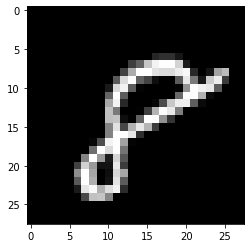

In [4]:
plt.imshow(X_train[-1,:,:,0], cmap='gray')
plt.show()

In [11]:
def pickle_save(fname, data):
  filehandler = open(fname,"wb")
  pickle.dump(data,filehandler)
  filehandler.close() 
  print('saved', fname, os.getcwd(), os.listdir())

def pickle_load(fname):
  print(os.getcwd(), os.listdir())
  file = open(fname,'rb')
  data = pickle.load(file)
  file.close()
  return data

## Create model

In [6]:
def get_cnn(input_shape, n_classes):
    
    model = Sequential()
    
    """
    ********** Feature extraction layers ********** 
    """
    
    # 1st Convolutional Layer
    model.add(Conv2D(filters=96, input_shape=input_shape, kernel_size=(2,2),strides=(2,2), padding='valid'))  #None, None
    model.add(Activation('relu'))
    # Pooling
    model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))
    # Batch Normalisation before passing it to the next layer
    model.add(BatchNormalization())
    
    # 2nd Convolutional Layer
    model.add(Conv2D(filters=256, kernel_size=(2,2), strides=(1,1), padding='valid')) #kernel_size=(5,5) dans le papier
    model.add(Activation('relu'))
    # Pooling
    model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))
    # Batch Normalisation
    model.add(BatchNormalization())
    
    # 3rd Convolutional Layer
    model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='valid'))
    model.add(Activation('relu'))
    # Batch Normalisation
    model.add(BatchNormalization())
    
    """
    ********** Classification layers **********
    """
    # Passing it to a dense layer
    model.add(Flatten())
    # 1st Dense Layer
    model.add(Dense(124))
    model.add(Activation('relu'))
    # Add Dropout to prevent overfitting
    model.add(Dropout(0.4))
    # Batch Normalisation
    model.add(BatchNormalization())
    
    # 2nd Dense Layer
    model.add(Dense(62))
    model.add(Activation('relu'))
    # Add Dropout
    model.add(Dropout(0.4))
    # Batch Normalisation
    model.add(BatchNormalization())
    
    # Output Layer
    model.add(Dense(n_classes))  
    model.add(Activation('softmax'))
        
    # (4) Compile
    #adam=Adam(lr=0.00001, decay=0.001)
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [7]:
class BaseSelectionFunction(object):

    def __init__(self):
        pass

    def select(self):
        pass


class RandomSelection(BaseSelectionFunction):

    @staticmethod
    def select(probas_val, initial_labeled_samples):

        selection = np.random.choice(probas_val.shape[0], initial_labeled_samples, replace=False)

#     print('uniques chosen:',np.unique(selection).shape[0],'<= should be equal to:',initial_labeled_samples)

        return selection


class EntropySelection(BaseSelectionFunction):

    @staticmethod
    def select(probas_val, initial_labeled_samples):
        e = (-probas_val * np.log2(probas_val)).sum(axis=1)
        selection = (np.argsort(e)[::-1])[:initial_labeled_samples]
        return selection
      
class MarginSamplingSelection(BaseSelectionFunction):

    @staticmethod
    def select(probas_val, initial_labeled_samples):
        
        rev = np.sort(probas_val, axis=1)[:, ::-1]
        values = rev[:, 0] - rev[:, 1]
        selection = np.argsort(values)[:initial_labeled_samples]
        return selection

In [8]:
class ActiveLearningModel(object):
    
    def __init__(self, input_shape, n_classes, model, selection_function = RandomSelection(), k = 10):

        self.input_shape = input_shape
        self.n_classes = n_classes
        self.chooseModel(model)
        self.sample_selection_function = selection_function 
        self.k = k
        
    def chooseModel(self, model):
        
        if model == 'cnn':
            
            self.model = get_cnn(self.input_shape, self.n_classes)
            
    def summary(self):
        
        self.model.summary()
            
    def activeTrain(self, X_train_full, y_train_full, X_test, y_test, max_queried_samples = 500,
                   epochs = 200, batch_size = 2000):
        
        test_set_accuracy = []
        test_set_loss = []
        
        sample_count = [self.k]
        active_iteration = 0
        
        print('-'*30)
        print('Iteration ', active_iteration)
        print('-'*30)
        
        permutation = np.random.choice(X_train_full.shape[0], self.k, replace=False)
        
        X_train = X_train_full[permutation]
        y_train = y_train_full[permutation]
        print('train set:', X_train.shape, y_train.shape, permutation.shape)
        
        bin_count = np.bincount(np.where(y_train == 1)[1].astype('int64'))
        unique = np.unique(y_train.astype('int64'))
        print ('unique(labels):', bin_count, unique)
  
        X_val = np.copy(X_train_full)
        X_val = np.delete(X_val, permutation, axis=0)
        y_val = np.copy(y_train_full)
        y_val = np.delete(y_val, permutation, axis=0)
        print('val set:', X_val.shape, y_val.shape, permutation.shape)
        
        # train model
        
        self.model.fit(X_train,y_train, batch_size = batch_size, epochs = epochs, verbose = None)
        
        # evaluate model performance in the test set
                
        loss, acc = self.model.evaluate(X_test,y_test)
        test_set_accuracy.append(acc)
        test_set_loss.append(loss)
                        
        print('Loss function: ', test_set_loss[active_iteration])
        print('Accuracy: ', test_set_accuracy[active_iteration])

        while (active_iteration+1)*self.k < max_queried_samples and len(X_val) is not 0:

            active_iteration += 1
            
            print('-'*30)
            print('Iteration ', active_iteration)
            print('-'*30)

            # get validation probabilities
        
            probas_val = self.model.predict(X_val.astype('float16'))
            
            print ('probabilities:', probas_val.shape, '\n', np.argmax(probas_val, axis=1))

            # select samples using a selection function

            uncertain_samples = self.sample_selection_function.select(probas_val, self.k)

            # get the uncertain samples from the validation set

            X_train = np.concatenate((X_train, X_val[uncertain_samples]))
            y_train = np.concatenate((y_train, y_val[uncertain_samples]))
            print ('Train set ', X_train.shape, y_train.shape)
            sample_count.append(X_train.shape[0])

            bin_count = np.bincount(np.where(y_train == 1)[1].astype('int64'))
            unique = np.unique(y_train.astype('int64'))
            print ('unique(labels):', bin_count, unique)

            X_val = np.delete(X_val, uncertain_samples, axis=0)
            y_val = np.delete(y_val, uncertain_samples, axis=0)
            print ('val set:', X_val.shape, y_val.shape)

            # train model

            self.model.fit(X_train,y_train, batch_size = batch_size, epochs = epochs, verbose = 0)

            # evaluate model performance in the test set

            loss, acc = self.model.evaluate(X_test,y_test)
            test_set_accuracy.append(acc)
            test_set_loss.append(loss)
            
            print('Loss function: ', test_set_loss[active_iteration])
            print('Accuracy: ', test_set_accuracy[active_iteration])

        print ('Final active learning loss ', test_set_loss[-1])
        print ('Final active learning accuracy ', test_set_accuracy[-1])
        
        keys = ['loss', 'accuracy','sample_count']
        vals = [test_set_loss, test_set_accuracy, sample_count]
        
        return dict(zip(keys, vals))
        #return dict(keys, vals)
    
    def save_weights(self, file):
        
        self.model.save_weights(file)
        
    def load_weights(self, file):
        
        self.model.load_weights(file)
        
    def predict_classes(self, X):
        
        return self.model.predict_classes(X.astype('float16'))

In [25]:
def plot_confusion_matrix(model, x, y_true, title = ''):
    """
    :param model: instance of the model
    :param x: input data
    :param y_true: true labels
    :param title: image title
    :return:
    """
    
    y_pred = model.predict_classes(x.astype('float16'))
    cm = tf.math.confusion_matrix(labels=np.argmax(y_true,axis=1), predictions=y_pred).eval(session = tf.Session())

    # we normalize the confusion matrix
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    fig, ax = plt.subplots(figsize = (6,6))

    # we plot

    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    ax.figure.colorbar(im, ax=ax)

    fmt = '.2f'
    thresh = cm.max() / 2
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    fig.tight_layout()
    plt.title(title)
    plt.show()

## CNN with Random sampling

In [11]:
cnn = ActiveLearningModel((X_train.shape[1],X_train.shape[2],1), n_classes = 10, model = 'cnn', k = 10)

In [ ]:
history = cnn.activeTrain(X_train, y_train, X_test, y_test)

------------------------------
Iteration  0
------------------------------
train set: (10, 28, 28, 1) (10, 10) (10,)
unique(labels): [0 1 1 1 4 0 0 2 1] [0 1]
val set: (59990, 28, 28, 1) (59990, 10) (10,)
10000/1 [==================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

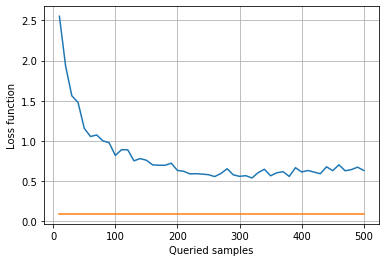

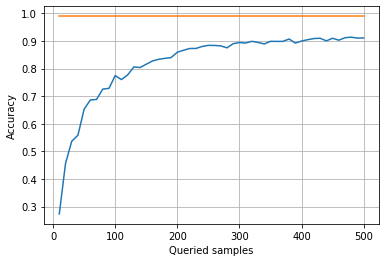

In [19]:
loss_supervised = 0.08971962127429858
acc_supervised = 0.9892

plt.plot(history['sample_count'], history['loss'])
plt.plot(history['sample_count'], loss_supervised*np.ones(len(history['sample_count'])))
plt.ylabel('Loss function')
plt.xlabel('Queried samples')
plt.grid()
plt.show()

plt.plot(history['sample_count'], history['accuracy'])
plt.plot(history['sample_count'], acc_supervised*np.ones(len(history['sample_count'])))
plt.ylabel('Accuracy')
plt.xlabel('Queried samples')
plt.grid()
plt.show()

In [21]:
cnn.save_weights('models/cnn_active_rnd_sample')
pickle_save('plots/cnn_active_history_rnd_sample', history)

saved plots/cnn_active_history_rnd_sample /notebooks ['.ipynb_checkpoints', 'checkpoint', 'cnn mnist.html', 'cnn mnist.ipynb', 'cnn_mnist.data-00000-of-00002', 'cnn_mnist.data-00001-of-00002', 'cnn_mnist.index', 'core', 'data', 'models', 'train-images-idx3-ubyte', 'storage', 'datasets', 'plots', 'cnn active learning - mnist dataset.ipynb']


## Load model

In [ ]:
loadded_hist = pickle_load('plots/cnn_active_history')

In [ ]:
plt.plot(history['loss'])
plt.title('Loss function')
plt.xlabel('Active Learning iteration')
plt.grid()
plt.show()

plt.plot(history['accuracy'])
plt.title('Accuracy')
plt.grid()
plt.xlabel('Active Learning iteration')
plt.show()

plt.plot(history['sample_count'])
plt.title('Sample count')
plt.grid()
plt.xlabel('Active Learning iteration')
plt.show()

In [ ]:
plot_confusion_matrix(cnn, X_test, y_test, title = 'Normalized confusion matrix')

## Different sample selection methods

Active learning is tested with three different selection functions: random selection, entropy selection and margin sampling selection. Results in terms of loss function and accuracy are compared with the fully supervised approach. Confusion matrices are also plotted.

In [ ]:
ss_methods = ['Random selection', 'Entropy selection', 'Margin sampling selection']
all_methods_history = []

ss_methods_switcher = {
    
    'Random selection' : RandomSelection(),
    'Entropy selection': EntropySelection(),
    'Margin sampling selection': MarginSamplingSelection()
}

for method in ss_methods:
    
    print(method)
    
    selec_func = ss_methods_switcher.get(method)
    
    cnn = ActiveLearningModel((X_train.shape[1],X_train.shape[2],1), n_classes = 10, model = 'cnn', k = 10,
                              selection_function = selec_func)
    
    history = cnn.activeTrain(X_train, y_train, X_test, y_test, max_queried_samples = 1000)
    all_methods_history.append(history)
    
    cnn.save_weights('models/cnn_active_'+method)
pickle_save('plots/cnn_active_all_methods_history', all_methods_history)

Random selection
------------------------------
Iteration  0
------------------------------
train set: (10, 28, 28, 1) (10, 10) (10,)
unique(labels): [0 1 0 1 2 2 0 2 1 1] [0 1]
val set: (59990, 28, 28, 1) (59990, 10) (10,)
10000/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [12]:
all_methods_history = pickle_load('plots/cnn_active_all_methods_history')

/home/gonzaq/Documents/Active Learning for Image Classification ['cnn mnist.ipynb', 'plots', 'cnn active learning - mnist dataset.ipynb', 'models', 'confusion_matrix.py', '.ipynb_checkpoints', 'data']


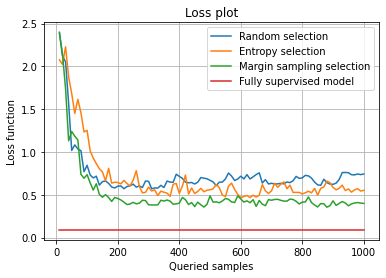

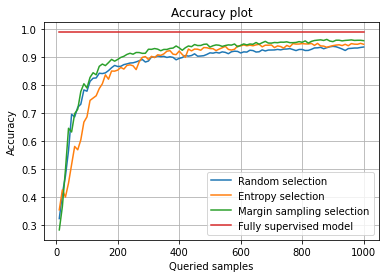

In [13]:
loss_supervised = 0.08971962127429858
acc_supervised = 0.9892
ss_methods = ['Random selection', 'Entropy selection', 'Margin sampling selection']
legend_values = list(ss_methods)
legend_values.append('Fully supervised model')

plt.figure()
for i in range(len(ss_methods)):
    
    plt.plot(all_methods_history[i]['sample_count'], all_methods_history[i]['loss'])

plt.plot(all_methods_history[i]['sample_count'], loss_supervised*np.ones(len(all_methods_history[i]['sample_count'])))
plt.ylabel('Loss function')
plt.xlabel('Queried samples')
plt.legend(legend_values)
plt.title('Loss plot')
plt.grid()
plt.show()

plt.figure()
for i in range(len(ss_methods)):
    
    plt.plot(all_methods_history[i]['sample_count'], all_methods_history[i]['accuracy'])

plt.plot(all_methods_history[i]['sample_count'], acc_supervised*np.ones(len(all_methods_history[i]['sample_count'])))
plt.ylabel('Accuracy')
plt.xlabel('Queried samples')
plt.title('Accuracy plot')
plt.legend(legend_values)
plt.grid()
plt.show()
   

In [27]:
cnnFS = get_cnn((X_train.shape[1],X_train.shape[2],1), n_classes = 10)
cnnFS.load_weights('models/cnn_sup')

cnnRS = ActiveLearningModel((X_train.shape[1],X_train.shape[2],1), n_classes = 10, model = 'cnn', k = 10,
                          selection_function = RandomSelection())
cnnRS.load_weights('models/cnn_active_Random selection')

cnnES = ActiveLearningModel((X_train.shape[1],X_train.shape[2],1), n_classes = 10, model = 'cnn', k = 10,
                          selection_function = EntropySelection())
cnnES.load_weights('models/cnn_active_Entropy selection')

cnnMSS = ActiveLearningModel((X_train.shape[1],X_train.shape[2],1), n_classes = 10, model = 'cnn', k = 10,
                          selection_function = MarginSamplingSelection())
cnnMSS.load_weights('models/cnn_active_Margin sampling selection')

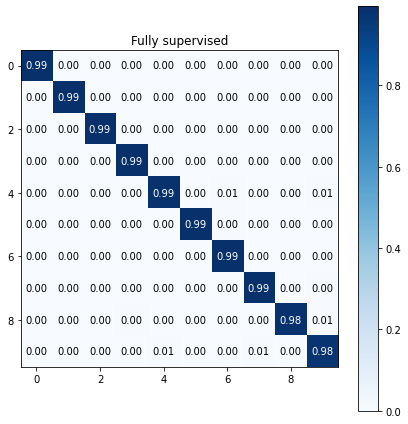

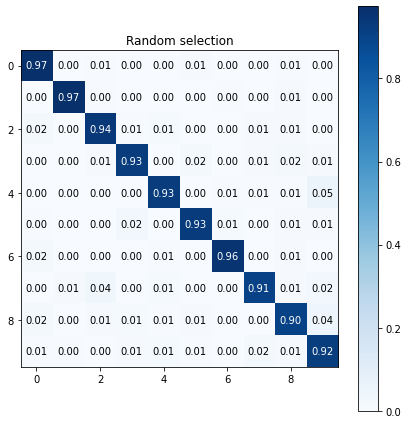

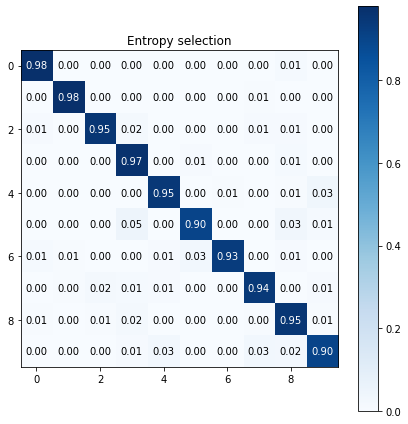

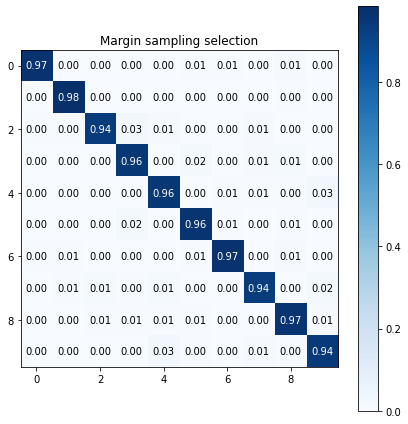

In [28]:
plot_confusion_matrix(cnnFS, X_test, y_test, title = 'Fully supervised')
plot_confusion_matrix(cnnRS, X_test, y_test, title = 'Random selection')
plot_confusion_matrix(cnnES, X_test, y_test, title = 'Entropy selection')
plot_confusion_matrix(cnnMSS, X_test, y_test, title = 'Margin sampling selection')